In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import interpolate

## Investigating the availibility of bikes throughout the day
Each row in station_vectors_24.csv is a station, and each colum is an hour of the day.
Every entry in the dataset is the average bike availibility for that station at that hour. The average was calculated from the OpenBus data, which is collected from 2015 - 2019

In [2]:
data = pd.read_csv('./../queries/get_station_vectors/station_vectors_24.csv')
#I would like to start my investigation by looking at the rows that no null entries
data = data[~data.isna().any(axis=1)]

In [3]:
data.head()

,dock_name,dock_id,_0,_1,_2,_3,_4,_5,_6,_7,...,_14,_15,_16,_17,_18,_19,_20,_21,_22,_23
0,W 52 St & 11 Ave,72,0.302204,0.306061,0.302767,0.300519,0.297297,0.287924,0.315648,0.326555,...,0.218717,0.204416,0.242766,0.219462,0.214205,0.210101,0.230221,0.241791,0.280144,0.297475
2,St James Pl & Pearl St,82,0.375000,0.351648,0.375000,0.375000,0.412088,0.404135,0.442857,0.456349,...,0.467532,0.406593,0.404762,0.413690,0.357143,0.342262,0.389610,0.395833,0.383929,0.375000
3,Atlantic Ave & Fort Greene Pl,83,0.387091,0.373010,0.374236,0.373201,0.373425,0.367281,0.373875,0.388223,...,0.429204,0.435559,0.431943,0.436743,0.436285,0.440306,0.448174,0.442505,0.424505,0.410172
4,W 17 St & 8 Ave,116,0.323301,0.316580,0.313338,0.310896,0.305242,0.302983,0.307329,0.309764,...,0.421524,0.381308,0.346123,0.283489,0.240743,0.256787,0.269961,0.301244,0.319510,0.328099
5,Park Ave & St Edwards St,119,0.524700,0.519366,0.524765,0.519407,0.525942,0.524967,0.522806,0.511419,...,0.425993,0.436040,0.449207,0.462066,0.488992,0.511405,0.514321,0.517569,0.522189,0.526874


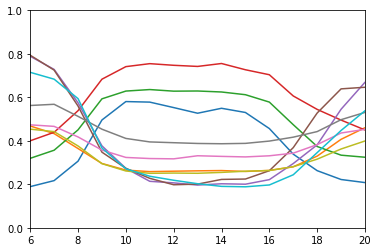

In [4]:
plt.ylim(0,1)
plt.xlim(6,20)
for i in range(120,130):
    plt.plot(range(0,24),data.filter(regex = '^_').iloc[i])


In [5]:
import plotly.graph_objs as go
import plotly.express as px


In [9]:
fig = go.Figure()
fig.layout.plot_bgcolor = 'black'
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
for i in range(120,220):
    fig.add_trace(go.Scatter(x = list(range(0,24)), 
                             y = data.filter(regex = '^_').iloc[i],
                            line = dict(color='rgba(204, 27, 14,.2)'))
                             )
    
fig.show()

In [18]:
from scipy import interpolate

In [25]:
f = interpolate.interp1d(list(range(0,24)),data.filter(regex = '^_').iloc[i],kind = 'quadratic')
new_y = f(np.linspace(0,23,100))

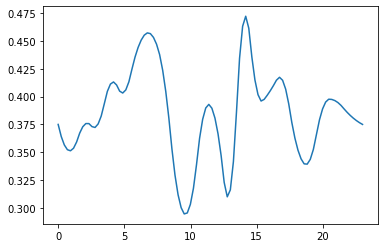

In [26]:
plt.plot(np.linspace(0,23,100),new_y)

In [40]:
fig = go.Figure()
# fig.layout.plot_bgcolor = 'black'
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
for i in range(120,420):
    f = interpolate.interp1d(list(range(0,24)),data.filter(regex = '^_').iloc[i],kind = 'quadratic')
    new_y = f(np.linspace(0,23,400))
    fig.add_trace(go.Scatter(x = np.linspace(0,23,400), 
                             y = new_y,
                            line = dict(color='rgba(204, 27, 14,.2)',),
                            showlegend=False)
                             )
    
fig.show()